# Group Info

**Group:** Group 85

**List of Members:**
- Mohammad Kiamari (437147)
- Sepehr Ghanbari (441268)
- Erfan Moeini (441639)

# Setup

In [40]:
from datetime import datetime, timedelta, time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pm4py
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
from sklearn.model_selection import ParameterGrid
import plotly.graph_objects as go
import time
import random
from IPython.display import display
import matplotlib.dates as mdates
import seaborn as sns
import os
import math

def load_log_without_warnings(path) -> pd.DataFrame:
    return log_converter.to_data_frame.apply(xes_importer.apply(path))

### Log Imports

In [41]:
udonya_log = load_log_without_warnings('./input-logs/udonya.xes')

parsing log, completed traces :: 100%|██████████████████████████████████████████| 16412/16412 [00:39<00:00, 415.17it/s]


In [19]:
ingredient_prep_A_log = load_log_without_warnings('./input-logs/ingredient_prep_A.xes')

parsing log, completed traces :: 100%|█████████████████████████████████████████████████████████| 314/314 [00:00<00:00, 900.72it/s]


In [20]:
ingredient_prep_B_log = load_log_without_warnings('./input-logs/ingredient_prep_B.xes')

parsing log, completed traces :: 100%|████████████████████████████████████████████████████████| 314/314 [00:00<00:00, 1874.82it/s]


In [51]:
customer_perspective_log = load_log_without_warnings('./input-logs/customer_perspective.xes')

parsing log, completed traces :: 100%|██████████████████████████████████████████| 14842/14842 [00:20<00:00, 740.22it/s]


In [2]:
dish_cooking_log = load_log_without_warnings('./input-logs/dish_cooking.xes')

D:\Projects\apm-assignment-1\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
parsing log, completed traces :: 100%|██████████████████████████████████████████| 14842/14842 [00:32<00:00, 453.34it/s]


# Process Overview

### Part (c): Variants Frequency Distribution

In this subtask, we find the frequency distribution of the unique trace variants in the event log. For this purpose, we calculate the absolute and relative frequency of the variants and finally visualize them using both a linear and log scale for the y-axis. The log scale is utilized since it depicts the drops in variants' frequency more concisely.

In [7]:
def extract_variants_frequency():
    variants = pm4py.get_variants(udonya_log)
    variants = sorted(variants.items(), key=lambda x: x[1], reverse=True)

    variants_info = {}
    for index, variant in enumerate(variants):
        variants_info[f"Variant {index}"] = variant[1]
    
    variants_df = pd.DataFrame({'Variant': list(variants_info.keys()), 'Count': list(variants_info.values())})
    variants_df['Percent'] = (variants_df['Count'] / variants_df['Count'].sum()) * 100
    return variants_df

def plot_variants_frequency(variants_df):
    fig, axes = plt.subplots(1, 2, figsize=(20,10))
    axes[0].set_xticks([])
    axes[1].set_xticks([])
    axes[0].title.set_text('Variants Distribution Linear Scale')
    axes[1].title.set_text('Variants Distribution Log Scale')
    axes[0].set_xlabel('Variants')
    axes[1].set_xlabel('Variants')
    sns.lineplot(data=variants_df, x='Variant', y='Count', ax=axes[0])
    plt.yscale('log')
    sns.lineplot(data=variants_df, x='Variant', y='Count', ax=axes[1])
    plt.tight_layout()
    plt.savefig('./submission-figures/q1_part_c_variants_distribution.png')

,Variant,Count,Percent
0,Variant 0,899,5.477699
1,Variant 1,891,5.428954
2,Variant 2,628,3.826468
3,Variant 3,628,3.826468
4,Variant 4,374,2.278820
...,...,...,...
7626,Variant 7626,1,0.006093
7627,Variant 7627,1,0.006093
7628,Variant 7628,1,0.006093
7629,Variant 7629,1,0.006093


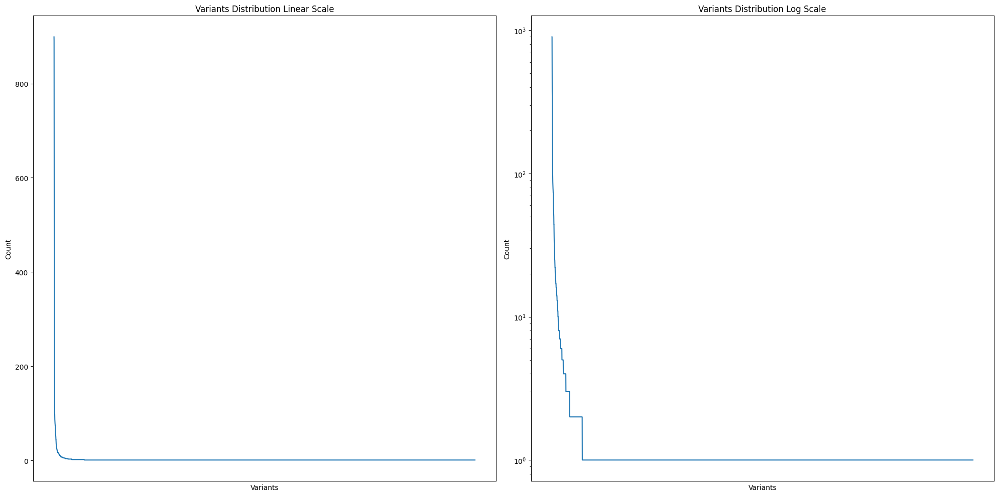

In [8]:
variants_df = extract_variants_frequency()
display(variants_df)
plot_variants_frequency(variants_df)

# Visual Analytics

### Part (b) ii.

In [9]:
def extract_log_based_on_case_type():
    case_types = udonya_log['case:case_type'].unique()
    for case_type in case_types:
        filtered_log = pm4py.filter_event_attribute_values(udonya_log, "case:case_type", [case_type], level="case", retain=True)
        dfg, sa, ea = pm4py.discover_directly_follows_graph(filtered_log)
        print(f"DFG for Case Type: {case_type}")
        pm4py.view_dfg(dfg, sa, ea)
        pm4py.save_vis_dfg(dfg, sa, ea,  f"./submission-figures/q2_part_b_ii_{case_type}_dfg.png")

D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


DFG for Case Type: prep


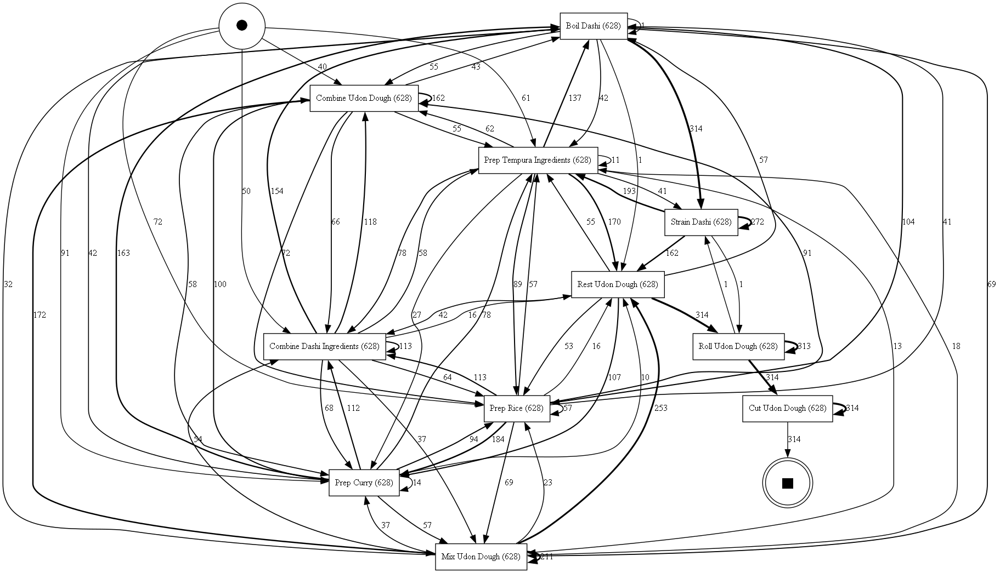

D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


DFG for Case Type: store


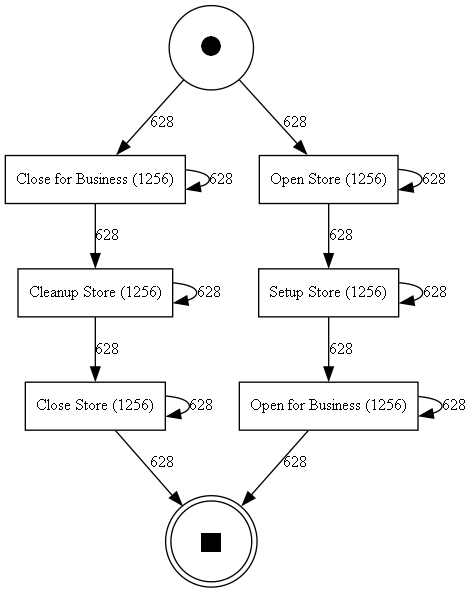

D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]


DFG for Case Type: customers


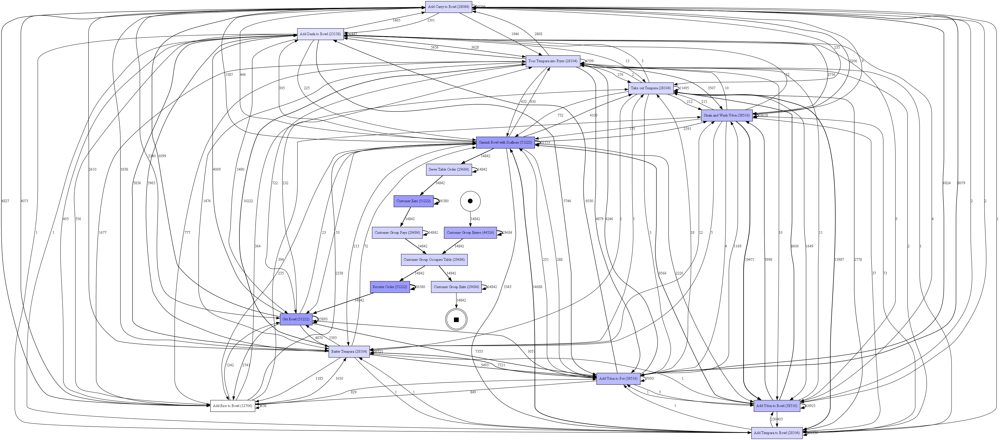

In [10]:
extract_log_based_on_case_type()

### Part (b) iii.

In [11]:
def discover_dfg(event_log, save_dfg=False, filename='default.png'):
    dfg, sa, ea = pm4py.discover_directly_follows_graph(event_log)
    pm4py.view_dfg(dfg, sa, ea)
    if save_dfg:
        pm4py.save_vis_dfg(dfg, sa, ea, f"./submission-figures/{filename}")

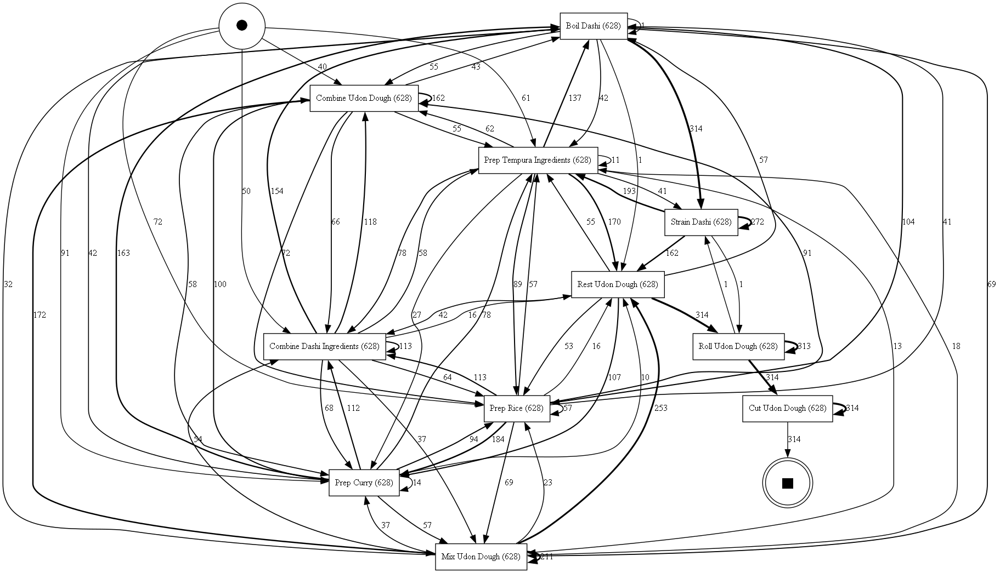

In [12]:
discover_dfg(ingredient_prep_A_log, save_dfg=True, filename="q2_part_b_iii_ing_prep_A_dfg.png")

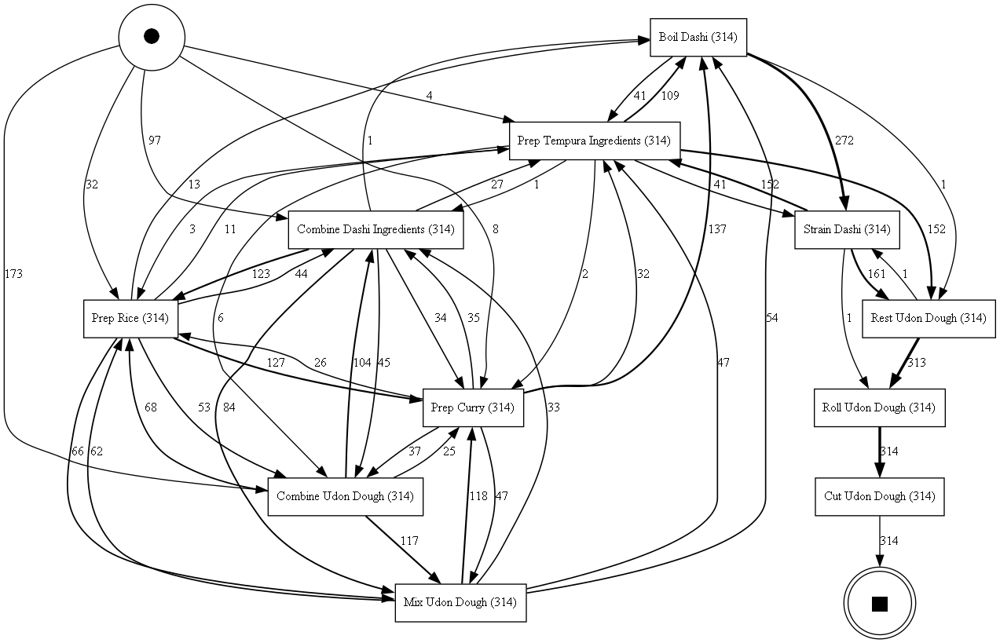

In [13]:
discover_dfg(ingredient_prep_B_log, save_dfg=True, filename="q2_part_b_iii_ing_prep_B_dfg.png")

# Process Discovery

### Part (a) i. and ii.

In [9]:
def analyze_model(log, net, im, fm, activity_key='concept:name', soundness_check=True, calc_simplicity=False):
    fitness = 0
    precision = 0
    f1_score = 0
    simplicity = -1
    try:
        fitness = pm4py.fitness_alignments(log, net, im, fm, activity_key=activity_key)
        fitness = fitness['average_trace_fitness']
    except Exception as ex:
        print("Could not compute fitness due to the structure of the model!")
    try:
        precision = pm4py.precision_alignments(log, net, im, fm, activity_key=activity_key)
    except Exception as ex:
        print("Could not compute precision due to the structure of the model!")
    # Check if the model is sound

    if soundness_check:
        soundness_result = pm4py.check_soundness(net, im, fm)
        if soundness_result[0]:
            print("Model is sound.")
        else:
            print("Model is not sound!")
    try:
        recall = fitness
        f1_score = (2 * precision * recall) / (precision + recall)
    except ZeroDivisionError:
        print("Could not compute f1_score due to the structure of the model!")
    
    if calc_simplicity:
        simplicity = simplicity_evaluator.apply(net)
        print(f"Simplicity Score: {simplicity}")
    return round(fitness, 2), round(precision, 2), round(f1_score, 2), round(simplicity, 2)

def discover_and_analyze_model(log, algorithm, activity_key='concept:name', noise_threshold=0.0, soundness_check=True, calc_simplicity=False, save_img=False, filename='default.png', format='png'):
    methods = {
        'alpha': pm4py.discover_petri_net_alpha,
        'heuristics': pm4py.discover_petri_net_heuristics,
        'inductive': pm4py.discover_petri_net_inductive,
        'ilp': pm4py.discover_petri_net_ilp   
    }
    if algorithm not in methods:
        return
    # Get the corresponding process discovery method based on the specified algorithm
    process_discovery_handler = methods[algorithm]
    # Process discovery using the specified algorithm
    if algorithm == 'inductive':
        net, im, fm = process_discovery_handler(log, activity_key=activity_key, noise_threshold=noise_threshold)
    else:
        net, im, fm = process_discovery_handler(log, activity_key=activity_key)
    # Calculate fitness and precision using the alignments method for the model discovered by the specified algorithm
    fitness, precision, f1_score, simplicity = analyze_model(log, net, im, fm, activity_key=activity_key, soundness_check=soundness_check, calc_simplicity=calc_simplicity)
    print(f"Fitness Alignments: {fitness}")
    print(f"Precision Alignments: {precision}")
    print(f"F1-Score: {f1_score}")
    # View the model discovered by the specified algorithm
    pm4py.view_petri_net(net, im, fm, format='png')
    if save_img:
        pm4py.save_vis_petri_net(net, im, fm, file_path=f'./submission-figures/{filename}')
    return fitness, precision, f1_score, simplicity

Could not compute fitness due to the structure of the model!
Could not compute precision due to the structure of the model!
Input is ok.
There is more than one sink place.
Model is not sound!
Could not compute f1_score due to the structure of the model!
Simplicity Score: 0.9259259259259258
Fitness Alignments: 0
Precision Alignments: 0
F1-Score: 0


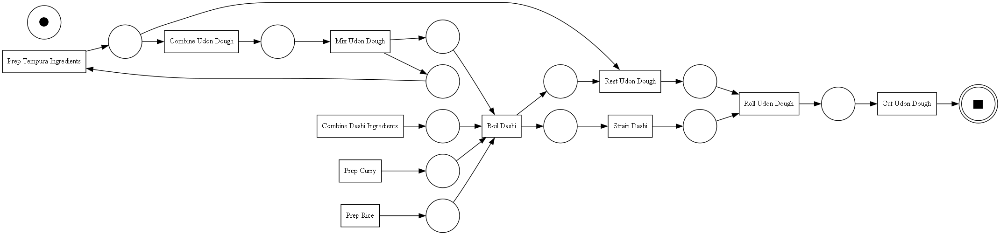

In [62]:
alpha_fitness, alpha_precision, alpha_f1_score, alpha_simplicity = discover_and_analyze_model(log=ingredient_prep_B_log, algorithm='alpha', calc_simplicity=True, save_img=True, filename='q3_part_a_i_alpha_miner.png')

aligning log, completed variants :: 100%|█████████████████████████████████████████████| 64/64 [00:00<00:00, 239.84it/s]
computing precision with alignments, completed variants :: 100%|███████████████████| 495/495 [00:00<00:00, 1021.16it/s]
D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\analysis\woflan\place_invariants\utility.py:151: UserWarning: solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.
  warnings.warn("solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.")


Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.
Model is sound.
Simplicity Score: 0.7272727272727273
Fitness Alignments: 0.96
Precision Alignments: 0.93
F1-Score: 0.95


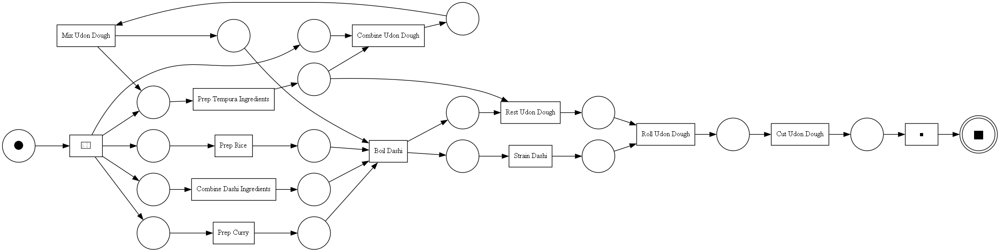

In [68]:
# Add an artificial start and end event to the log in order to solve the problem regarding the unconnectedness of the model discovered by alpha miner
enhanced_ing_prep_B_log = pm4py.analysis.insert_artificial_start_end(ingredient_prep_B_log)
enhanced_alpha_fitness, enhanced_alpha_precision, enhanced_alpha_f1_score, enhanced_alpha_simplicity = discover_and_analyze_model(log=enhanced_ing_prep_B_log, algorithm='alpha', calc_simplicity=True, save_img=True, filename='q3_part_a_i_enhanced_alpha_miner.png')

aligning log, completed variants :: 100%|█████████████████████████████████████████████| 64/64 [00:00<00:00, 243.07it/s]
computing precision with alignments, completed variants :: 100%|███████████████████| 430/430 [00:00<00:00, 1099.75it/s]
D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\analysis\woflan\place_invariants\utility.py:151: UserWarning: solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.
  warnings.warn("solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.")


Input is ok.
Petri Net is a workflow net.
The following places are not covered by an s-component: [intplace_Prep Rice, intplace_Prep Tempura Ingredients, intplace_Strain Dashi, pre_Combine Udon Dough, pre_Cut Udon Dough, pre_Mix Udon Dough, pre_Prep Curry, pre_Prep Tempura Ingredients, pre_Rest Udon Dough, pre_Roll Udon Dough, pre_Strain Dashi, sink0, source0, splace_in_Boil Dashi_Mix Udon Dough_0, splace_in_Boil Dashi_Prep Curry_0, splace_in_Boil Dashi_Prep Rice_0, splace_in_Prep Tempura Ingredients_Combine Dashi Ingredients_0, splace_in_Prep Tempura Ingredients_Mix Udon Dough_0, splace_in_Prep Tempura Ingredients_Prep Curry_0, splace_in_Prep Tempura Ingredients_Prep Rice_0].
Model is not sound!
Simplicity Score: 0.6721311475409836
Fitness Alignments: 0.53
Precision Alignments: 1.0
F1-Score: 0.7


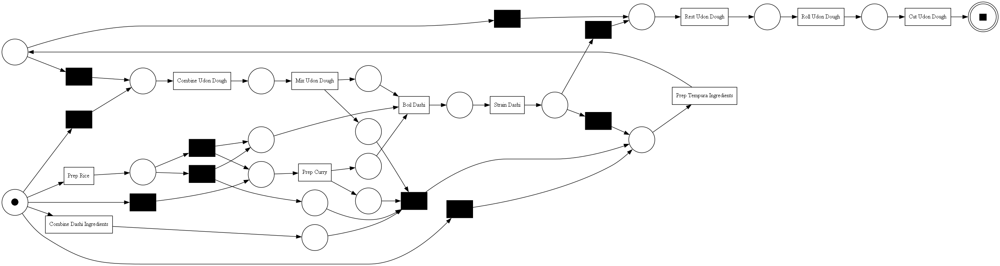

In [64]:
heuristics_fitness, heuristics_precision, heuristics_f1_score, heuristics_simplicity = discover_and_analyze_model(log=ingredient_prep_B_log, algorithm='heuristics', calc_simplicity=True, save_img=True, filename='q3_part_a_i_heuristics_miner.png')

aligning log, completed variants :: 100%|█████████████████████████████████████████████| 64/64 [00:00<00:00, 263.47it/s]
computing precision with alignments, completed variants :: 100%|████████████████████| 430/430 [00:00<00:00, 590.59it/s]
D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\analysis\woflan\place_invariants\utility.py:151: UserWarning: solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.
  warnings.warn("solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.")


Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.
Model is sound.
Simplicity Score: 0.7560975609756097
Fitness Alignments: 1.0
Precision Alignments: 0.66
F1-Score: 0.8


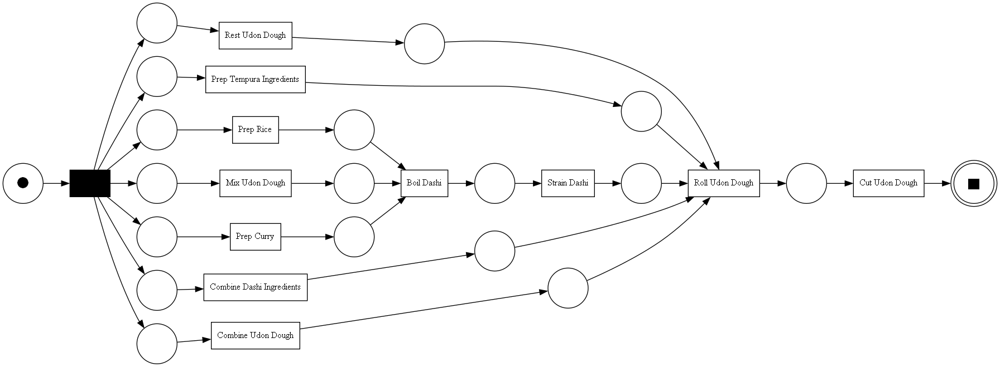

In [65]:
inductive_fitness, inductive_precision, inductive_f1_score, inductive_simplicity = discover_and_analyze_model(log=ingredient_prep_B_log, algorithm='inductive', save_img=True, calc_simplicity=True, filename='q3_part_a_i_inductive_miner.png')

discovering Petri net using ILP miner, completed causal relations :: 100%|████████████| 19/19 [00:00<00:00, 268.31it/s]
aligning log, completed variants :: 100%|█████████████████████████████████████████████| 64/64 [00:00<00:00, 295.60it/s]
computing precision with alignments, completed variants :: 100%|████████████████████| 430/430 [00:00<00:00, 738.01it/s]


Input is ok.
Petri Net is a workflow net.
The following places are not covered by an s-component: [17].
Model is not sound!
Simplicity Score: 0.5714285714285714
Fitness Alignments: 1.0
Precision Alignments: 0.94
F1-Score: 0.97


D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\analysis\woflan\place_invariants\utility.py:151: UserWarning: solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.
  warnings.warn("solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.")


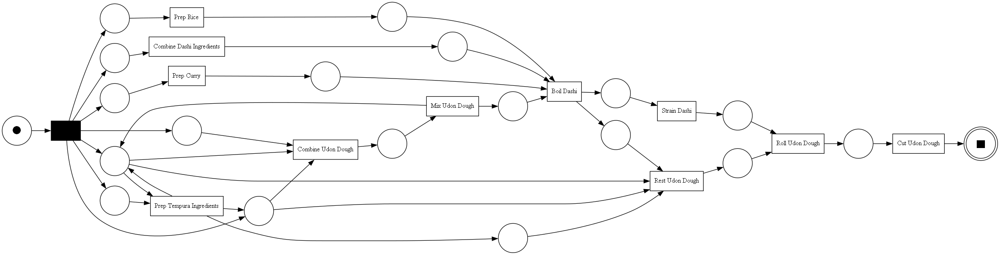

In [66]:
ilp_fitness, ilp_precision, ilp_f1_score, ilp_simplicity = discover_and_analyze_model(log=ingredient_prep_B_log, algorithm='ilp', save_img=True, calc_simplicity=True, filename='q3_part_a_i_ilp_miner.png')

In [10]:
def plot_model_eval_metrics(mining_variants, fitness_values, precision_values, f1_score_values, simplicity_score_values=None, title='', x_label='', bar_width=0.25, figsize=(16, 9), filename='eval_metrics_default.png'):
    metrics = {
        'Fitness': fitness_values,
        'Precision': precision_values,
        'F1-Score': f1_score_values,
    }
    if simplicity_score_values:
        metrics['Simplicity Score'] = simplicity_score_values
    x = np.arange(len(mining_variants))  # the label locations
    width = bar_width  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots(layout='constrained', figsize=figsize)

    for attribute, measurement in metrics.items():
        offset = width * multiplier
        rects = ax.bar(x + offset, measurement, width, label=attribute)
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_title(title, pad=20)
    ax.set_xlabel(x_label)
    ax.set_ylabel('Metric Value')
    ax.set_xticks(x + width, mining_variants)
    ax.legend(loc='upper left', ncols=len(metrics.keys()))
    ax.set_ylim(0, 1)
    plt.tight_layout()
    plt.show()
    fig.savefig(f'./submission-figures/{filename}')

C:\Users\Erfan Moeini\AppData\Local\Temp\ipykernel_4824\3561891893.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


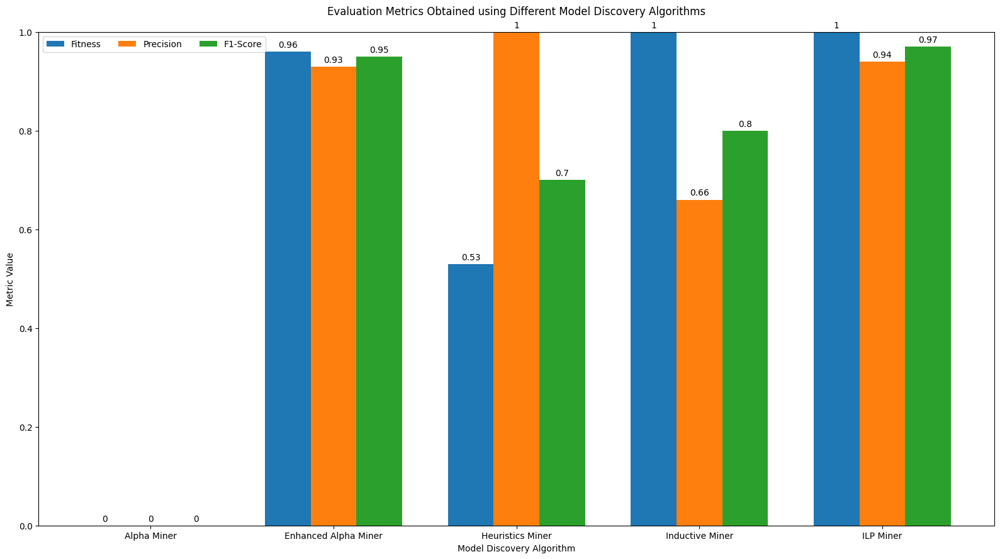

In [74]:
mining_variants = ("Alpha Miner", "Enhanced Alpha Miner", "Heuristics Miner", "Inductive Miner", "ILP Miner")
fitness_values = (alpha_fitness, enhanced_alpha_fitness, heuristics_fitness, inductive_fitness, ilp_fitness)
precision_values = (alpha_precision, enhanced_alpha_precision, heuristics_precision, inductive_precision, ilp_precision)
f1_score_values = (alpha_f1_score, enhanced_alpha_f1_score, heuristics_f1_score, inductive_f1_score, ilp_f1_score)
plot_model_eval_metrics(mining_variants, fitness_values, precision_values, f1_score_values, title='Evaluation Metrics Obtained using Different Model Discovery Algorithms', x_label='Model Discovery Algorithm', filename='q3_part_a_ii_eval_metrics.png');

### Part (a.iii)

Here we are ensuring that a trace does not appear in the log, but the behavior is possible according to the model discovered by the **Inductive Miner**. According to the model, we can perform the activity **Mix Udon Dough** before the activity **Combine Udon Dough**, which is not reasonable. However, there's no trace in the log that depicts this behavior.

In [16]:
# Check if there's any sign of mixing udon dough before combining udon dough
ingredients_prep_B_event_log = pm4py.convert_to_event_log(ingredient_prep_B_log)
for trace in ingredients_prep_B_event_log:
    combine_index = 0
    mix_index = 0
    for index, event in enumerate(trace):
        if event['concept:name'] == 'Combine Udon Dough':
            combine_index = index
        elif event['concept:name'] == 'Mix Udon Dough':
            mix_index = index
    if mix_index < combine_index:
        print('Mixing before combining!')

D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


### Part (c) i.

Adding activity lifecycle attribute to the event log

In [11]:
ingredient_prep_A_log["activity_lifecycle"] = ingredient_prep_A_log["concept:name"] + "+" + ingredient_prep_A_log["lifecycle:transition"]
ingredient_prep_A_log

,concept:name,time:timestamp,org:resource,lifecycle:transition,duration_in_s,case:concept:name,case:case_type,activity_lifecycle
0,Prep Curry,2023-04-01 06:00:00+00:00,Oku-san,start,3720.0,prep_0,prep,Prep Curry+start
1,Combine Udon Dough,2023-04-01 06:00:00+00:00,Tenchou-san,start,480.0,prep_0,prep,Combine Udon Dough+start
2,Combine Dashi Ingredients,2023-04-01 06:00:00+00:00,Tenchou-san,start,1440.0,prep_0,prep,Combine Dashi Ingredients+start
3,Combine Udon Dough,2023-04-01 06:08:00+00:00,Tenchou-san,complete,NaN,prep_0,prep,Combine Udon Dough+complete
4,Prep Rice,2023-04-01 06:08:00+00:00,Tenchou-san,start,1680.0,prep_0,prep,Prep Rice+start
...,...,...,...,...,...,...,...,...
6903,Rest Udon Dough,2024-03-31 09:19:00+00:00,Kitchen,complete,NaN,prep_626,prep,Rest Udon Dough+complete
6904,Roll Udon Dough,2024-03-31 09:19:00+00:00,Deshi-san A,start,1980.0,prep_626,prep,Roll Udon Dough+start
6905,Roll Udon Dough,2024-03-31 09:52:00+00:00,Deshi-san A,complete,NaN,prep_626,prep,Roll Udon Dough+complete
6906,Cut Udon Dough,2024-03-31 09:52:00+00:00,Deshi-san A,start,540.0,prep_626,prep,Cut Udon Dough+start


### Part (c) ii.

In [12]:
def run_parameterized_inductive_miner(log, noise_thresholds, activity_key='concept:name', calc_simplicity=False, store_result=False, prefix='default', filename='default.csv'):
    result = {
        'noise_threshold': [],
        'fitness': [],
        'precision': [],
        'f1_score': []
    }
    if calc_simplicity:
        result['simplicity'] = []

    for threshold in noise_thresholds:
        print(f"Noise Threshold: {threshold}")
        fitness, precision, f1_score, simplicity = discover_and_analyze_model(log=log, activity_key=activity_key, algorithm='inductive', noise_threshold=threshold, soundness_check=False, calc_simplicity=calc_simplicity, save_img=True, filename=f"{prefix}_Inductive_NT_{threshold}.png")
        result['noise_threshold'].append(threshold)
        result['fitness'].append(fitness)    
        result['precision'].append(precision)    
        result['f1_score'].append(f1_score)
        if calc_simplicity:
            result['simplicity'].append(simplicity)

    result_df = pd.DataFrame(result)
    if store_result:
        result_df.to_csv(f"./submission-data/{prefix}_{filename}")
    return result_df

Noise Threshold: 0.0


aligning log, completed variants :: 100%|███████████████████████████████████████████| 271/271 [00:02<00:00, 124.98it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 4311/4311 [00:16<00:00, 259.06it/s]


Fitness Alignments: 1.0
Precision Alignments: 0.45
F1-Score: 0.62


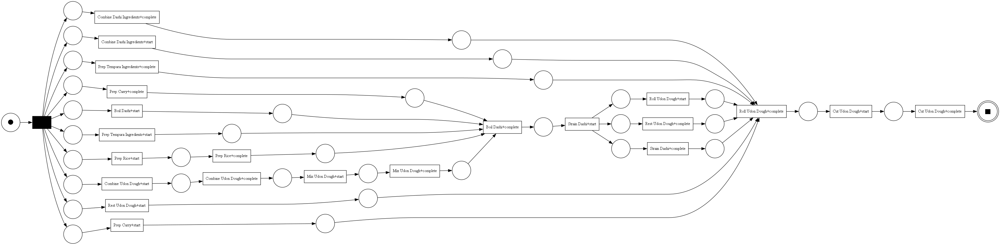

Noise Threshold: 0.25


aligning log, completed variants :: 100%|████████████████████████████████████████████| 271/271 [01:29<00:00,  3.01it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 4311/4311 [00:21<00:00, 196.95it/s]


Fitness Alignments: 0.94
Precision Alignments: 0.67
F1-Score: 0.78


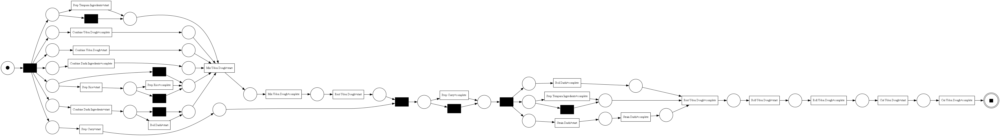

Noise Threshold: 0.5


aligning log, completed variants :: 100%|████████████████████████████████████████████| 271/271 [00:28<00:00,  9.54it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 4311/4311 [00:14<00:00, 300.10it/s]


Fitness Alignments: 0.88
Precision Alignments: 0.61
F1-Score: 0.72


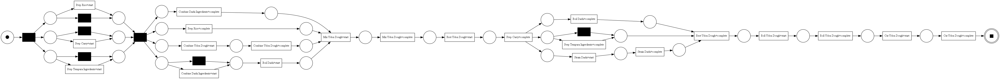

Noise Threshold: 0.75


aligning log, completed variants :: 100%|████████████████████████████████████████████| 271/271 [00:07<00:00, 36.03it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 4311/4311 [00:07<00:00, 577.02it/s]


Fitness Alignments: 0.77
Precision Alignments: 1.0
F1-Score: 0.87


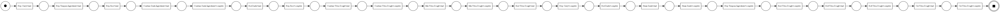

Noise Threshold: 1


aligning log, completed variants :: 100%|███████████████████████████████████████████| 271/271 [00:01<00:00, 232.07it/s]
computing precision with alignments, completed variants :: 100%|█████████████████| 4311/4311 [00:04<00:00, 1020.98it/s]


Fitness Alignments: 0.28
Precision Alignments: 0.5
F1-Score: 0.36


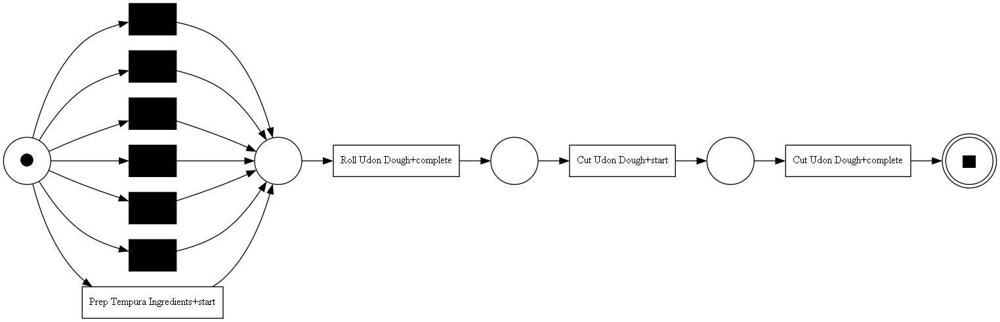

,noise_threshold,fitness,precision,f1_score
0,0.00,1.00,0.45,0.62
1,0.25,0.94,0.67,0.78
2,0.50,0.88,0.61,0.72
3,0.75,0.77,1.00,0.87
4,1.00,0.28,0.50,0.36


In [14]:
noise_thresholds = [0.0, 0.25, 0.5, 0.75, 1]
run_parameterized_inductive_miner(ingredient_prep_A_log, noise_thresholds=noise_thresholds, activity_key='activity_lifecycle', store_result=True, prefix='q3_part_c_ii_ing_A', filename='performance.csv')

# Conformance Checking

### Part (a) i.

Noise Threshold: 0


aligning log, completed variants :: 100%|████████████████████████████████████████████| 127/127 [00:06<00:00, 19.73it/s]
computing precision with alignments, completed variants :: 100%|███████████████████| 2463/2463 [00:52<00:00, 46.76it/s]


Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.


D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\algo\analysis\woflan\place_invariants\utility.py:151: UserWarning: solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.
  warnings.warn("solution from scipy may be unstable. Please install PuLP (pip install pulp) for fully reliable results.")


There are no dead tasks.
All tasks are live.
Model is sound.
Simplicity Score: 0.7499999999999999
Fitness Alignments: 1.0
Precision Alignments: 0.72
F1-Score: 0.84


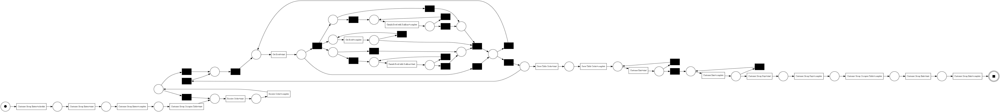

Noise Threshold: 0.5


aligning log, completed variants :: 100%|████████████████████████████████████████████| 127/127 [00:08<00:00, 15.72it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 2463/2463 [00:23<00:00, 102.73it/s]


Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.
Model is sound.
Simplicity Score: 0.8235294117647058
Fitness Alignments: 1.0
Precision Alignments: 0.88
F1-Score: 0.93


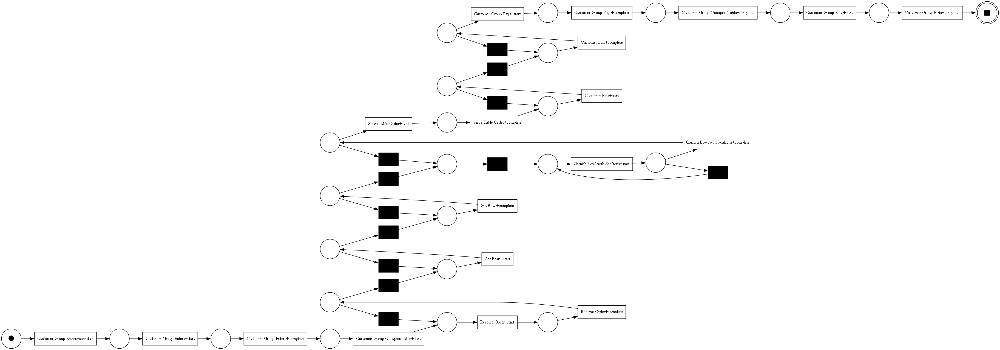

Noise Threshold: 1


aligning log, completed variants :: 100%|████████████████████████████████████████████| 127/127 [00:03<00:00, 34.70it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 2463/2463 [00:07<00:00, 331.76it/s]


Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.
Model is sound.
Simplicity Score: 0.8245614035087718
Fitness Alignments: 0.83
Precision Alignments: 0.9
F1-Score: 0.86


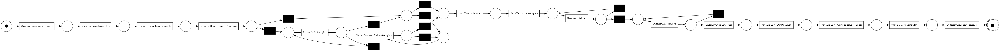

In [49]:
noise_thresholds = [0, 0.5, 1]
eval_df = run_parameterized_inductive_miner(customer_perspective_log, noise_thresholds=noise_thresholds, activity_key='combined_lifecycle', calc_simplicity=True, store_result=True, prefix='q4_part_a_i', filename='performance.csv')
display(eval_df)

### Part (a) ii.

In [57]:
def load_and_analyze_model(model_filename, output_filename):
    net, initial_marking, final_marking = pm4py.read_pnml(f"./input-models/{model_filename}")
    pm4py.view_petri_net(net, initial_marking, final_marking)
    pm4py.save_vis_petri_net(net, initial_marking, final_marking, file_path=f'./submission-figures/{output_filename}')
    fitness, precision, f1_score, simplicity = analyze_model(customer_perspective_log, net, initial_marking, final_marking, activity_key='combined_lifecycle', soundness_check=True, calc_simplicity=True)
    print(f"Fitness Alignments: {fitness}")
    print(f"Precision Alignments: {precision}")
    print(f"F1-Score: {f1_score}")
    return fitness, precision, f1_score, simplicity

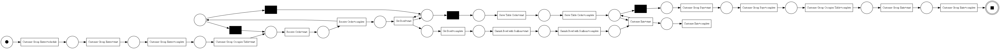

aligning log, completed variants :: 100%|████████████████████████████████████████████| 127/127 [00:01<00:00, 69.40it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 2463/2463 [00:15<00:00, 154.27it/s]


Input is ok.
Petri Net is a not a worflow net.
Model is not sound!
Simplicity Score: 0.851851851851852
Fitness Alignments: 1.0
Precision Alignments: 0.81
F1-Score: 0.9


In [58]:
hm_cp_fitness, hm_cp_precision, hm_cp_f1_score, hm_cp_simplicity = load_and_analyze_model("customer_perspective.pnml", output_filename='q4_part_a_ii_cp.png')
# Not Safe
# No Proper Completion
# No Option to Complete
# Absence of dead parts is satisfied

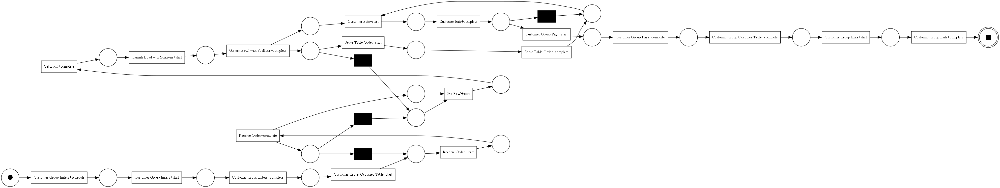

aligning log, completed variants :: 100%|████████████████████████████████████████████| 127/127 [01:27<00:00,  1.46it/s]
computing precision with alignments, completed variants :: 100%|██████████████████| 2463/2463 [00:10<00:00, 239.21it/s]


Input is ok.
Petri Net is a workflow net.
The following places are not covered by an s-component: [n10, n8].
Model is not sound!
Simplicity Score: 0.851851851851852
Fitness Alignments: 0.91
Precision Alignments: 1.0
F1-Score: 0.95


In [59]:
hm_cp_seq_fitness, hm_cp_seq_precision, hm_cp_seq_f1_score, hm_cp_seq_simplicity = load_and_analyze_model("customer_perspective_seq.pnml", output_filename='q4_part_a_ii_cp_seq.png')
# Not Safe
# No Proper Completion
# No Option to Complete
# Absence of dead parts is satisfied

### Part (a) iv.

C:\Users\Erfan Moeini\AppData\Local\Temp\ipykernel_12820\3561891893.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


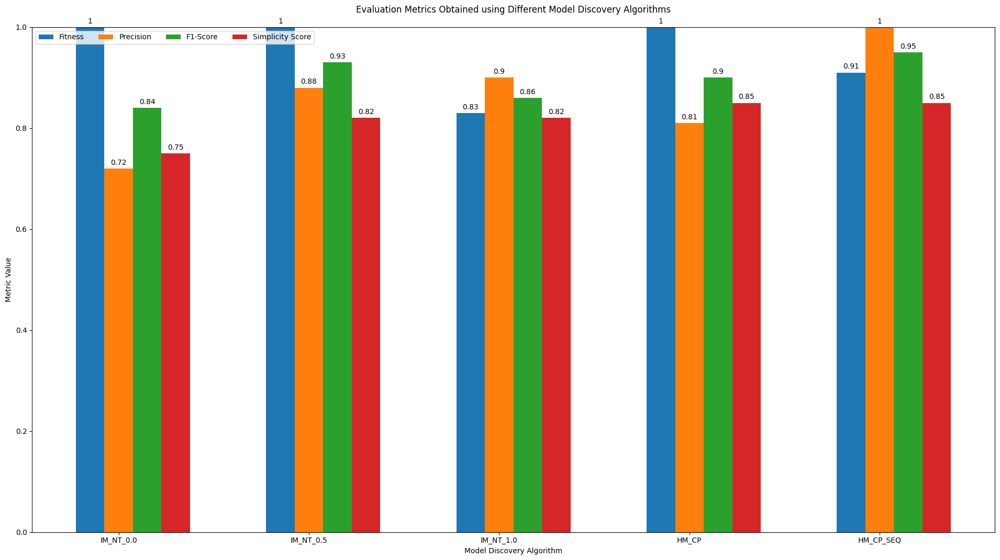

In [105]:
fitness_values, precision_values, f1_score_values, simplicity_score_values = eval_df['fitness'].values.tolist(), eval_df['precision'].values.tolist(), eval_df['f1_score'].values.tolist(), eval_df['simplicity'].values.tolist()
mining_variants = ("IM_NT_0.0", "IM_NT_0.5", "IM_NT_1.0", "HM_CP", "HM_CP_SEQ")
fitness_values.extend([hm_cp_fitness, hm_cp_seq_fitness])
precision_values.extend([hm_cp_precision, hm_cp_seq_precision])
f1_score_values.extend([hm_cp_f1_score, hm_cp_seq_f1_score])
simplicity_score_values.extend([hm_cp_simplicity, hm_cp_seq_simplicity])
plot_model_eval_metrics(mining_variants, fitness_values, precision_values, f1_score_values, simplicity_score_values=simplicity_score_values, title='Evaluation Metrics Obtained using Different Model Discovery Algorithms', x_label='Model Discovery Algorithm', bar_width=0.15, figsize=(19.2, 10.8), filename='q4_part_a_iv_eval_metrics.png');

# Diving Into Some Details

### Part (a) i.

In [42]:
variants = pm4py.get_variants(dish_cooking_log)
print(f"Number of unique variants: {len(variants)}")

Number of unique variants: 7358


### Part (a) ii.

In [43]:
trace_variants = list(variants.keys())

In [44]:
def check_set_equality(first_set, second_set):
    return len(first_set) == len(second_set) and all([item in second_set for item in first_set])

def extract_unique_variant_set(trace_variants_list):
    unique_variant_sets = []
    for variant in trace_variants_list:
        curr_variant_set = set(variant)
        variant_set_exists = any([check_set_equality(curr_variant_set, variant_set) for variant_set in unique_variant_sets])
        if not variant_set_exists:
            unique_variant_sets.append(curr_variant_set)
    return unique_variant_sets

unique_variant_sets = extract_unique_variant_set(trace_variants)
print(f"Number of unique variant sets: {len(unique_variant_sets)}")

Number of unique variant sets: 8


### Part (a) iii.

In [52]:
# Choose a random variant
random_variant_set = unique_variant_sets[2]
dish_prep_related_events = ['']
# Find a case belonging to this variant
case_events = dish_cooking_log.groupby('case:concept:name')['concept:name'].apply(list).reset_index(name='concept:name')
case_with_same_variant = None
for index, case_event in case_events.iterrows():
    if check_set_equality(case_event['concept:name'], random_variant_set):
        case_with_same_variant = case_event
        break

        
print(case_event['concept:name'])

['Receive Order', 'Receive Order', 'Receive Order', 'Receive Order', 'Get Bowl', 'Get Bowl', 'Get Bowl', 'Add Udon to Pot', 'Add Curry to Bowl', 'Get Bowl', 'Add Rice to Bowl', 'Add Curry to Bowl', 'Add Udon to Pot', 'Add Rice to Bowl', 'Add Curry to Bowl', 'Add Curry to Bowl', 'Garnish Bowl with Scallions', 'Garnish Bowl with Scallions', 'Strain and Wash Udon', 'Strain and Wash Udon', 'Add Udon to Bowl', 'Add Udon to Bowl', 'Garnish Bowl with Scallions', 'Garnish Bowl with Scallions']


In [53]:
def get_dish_prep_events(events):
    # Only keep the events in the form of 'Add X to Bowl'
    add_ing_events = [item for item in events if item.startswith('Add') and item.endswith('Bowl')]
    return add_ing_events

def discover_dishes(unique_variant_sets):
    for index, var_set in enumerate(unique_variant_sets):
        var_set_dish_ing = get_dish_prep_events(var_set)
        print(f"Variant {index + 1}: {' >> '.join(var_set_dish_ing)}")

In [54]:
discover_dishes(unique_variant_sets)

Variant 1: Add Dashi to Bowl >> Add Udon to Bowl >> Add Tempura to Bowl
Variant 2: Add Curry to Bowl >> Add Udon to Bowl
Variant 3: Add Curry to Bowl >> Add Tempura to Bowl >> Add Rice to Bowl
Variant 4: Add Curry to Bowl >> Add Rice to Bowl
Variant 5: Add Dashi to Bowl >> Add Curry to Bowl >> Add Udon to Bowl >> Add Tempura to Bowl >> Add Rice to Bowl
Variant 6: Add Dashi to Bowl >> Add Curry to Bowl >> Add Udon to Bowl >> Add Tempura to Bowl
Variant 7: Add Curry to Bowl >> Add Udon to Bowl >> Add Rice to Bowl
Variant 8: Add Curry to Bowl >> Add Udon to Bowl >> Add Tempura to Bowl >> Add Rice to Bowl


### Part (a) iv.

In [55]:
dish_log_copy = dish_cooking_log.copy()

# We can simply drop NaN values of this column, as they are only present in the events which are not related to dish preparation
dish_log_copy['global_order_id'].dropna(inplace=True)

# Consider the column 'global_order_id' as the case ID
dish_log_copy = pm4py.format_dataframe(dish_log_copy, case_id='global_order_id')

new_variants = pm4py.get_variants(dish_log_copy)
print(f"Number of unique variants with the new approach: {len(new_variants)}")

new_trace_variants = list(new_variants.keys())
new_unique_variant_sets = extract_unique_variant_set(new_trace_variants)
print(f"Number of unique variant sets with the new approach: {len(new_unique_variant_sets)}")

C:\Users\Erfan Moeini\AppData\Local\Temp\ipykernel_8440\598653312.py:7: DeprecatedWarning: format_dataframe is deprecated as of 2.3.0 and will be removed in 3.0.0. the format_dataframe function does not need application anymore.
  dish_log_copy = pm4py.format_dataframe(dish_log_copy, case_id='global_order_id')
D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\objects\log\util\dataframe_utils.py:176: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], utc=True)
D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\objects\log\util\dataframe_utils.py:176: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], utc=True)
D:\Projects\apm-assignment-1\v

Number of unique variants with the new approach: 1170
Number of unique variant sets with the new approach: 4


In [56]:
discover_dishes(new_unique_variant_sets)

Variant 1: Add Dashi to Bowl >> Add Udon to Bowl >> Add Tempura to Bowl
Variant 2: Add Curry to Bowl >> Add Udon to Bowl
Variant 3: Add Curry to Bowl >> Add Tempura to Bowl >> Add Rice to Bowl
Variant 4: Add Curry to Bowl >> Add Rice to Bowl


### Part (b) i.

In [57]:
customer_pay_df = customer_perspective_log[customer_perspective_log['combined_lifecycle'] == 'Customer Group Pays+complete']
customer_pay_df

,concept:name,time:timestamp,lifecycle:transition,org:resource,combined_lifecycle,case:concept:name,case:case_type,case:customer_group_id,case:customer_count,duration_in_s,order_no,global_order_id,dish,amount
15,Customer Group Pays,2023-04-01 09:50:36.666000+00:00,complete,Customer-san,Customer Group Pays+complete,customers_0,customers,regular_0,1,NaN,NaN,NaN,NaN,770.0
50,Customer Group Pays,2023-04-01 10:13:10+00:00,complete,Customer-san,Customer Group Pays+complete,customers_1,customers,regular_1,3,NaN,NaN,NaN,NaN,2500.0
69,Customer Group Pays,2023-04-01 10:20:01.833000+00:00,complete,Customer-san,Customer Group Pays+complete,customers_2,customers,regular_2,1,NaN,NaN,NaN,NaN,770.0
104,Customer Group Pays,2023-04-01 10:30:59+00:00,complete,Customer-san,Customer Group Pays+complete,customers_3,customers,regular_3,3,NaN,NaN,NaN,NaN,2620.0
139,Customer Group Pays,2023-04-01 10:45:25+00:00,complete,Customer-san,Customer Group Pays+complete,customers_4,customers,regular_4,3,NaN,NaN,NaN,NaN,2620.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368038,Customer Group Pays,2024-03-31 17:25:08.500000+00:00,complete,Customer-san,Customer Group Pays+complete,customers_13754,customers,regular_13754,2,NaN,NaN,NaN,NaN,1770.0
368065,Customer Group Pays,2024-03-31 17:28:57.333000+00:00,complete,Customer-san,Customer Group Pays+complete,customers_13755,customers,regular_13755,2,NaN,NaN,NaN,NaN,1000.0
368092,Customer Group Pays,2024-03-31 17:52:43.500000+00:00,complete,Customer-san,Customer Group Pays+complete,customers_13756,customers,regular_13756,2,NaN,NaN,NaN,NaN,1770.0
368111,Customer Group Pays,2024-03-31 18:00:12+00:00,complete,Customer-san,Customer Group Pays+complete,customers_13757,customers,regular_13757,1,NaN,NaN,NaN,NaN,1000.0


In [58]:
total_revenue = customer_pay_df.amount.sum()

daily_revenue = customer_pay_df.groupby([pd.Grouper(key='time:timestamp', freq='D')]).amount.sum().reset_index()
# Exclude Mondays (Non-working days)
daily_revenue = daily_revenue[daily_revenue['time:timestamp'].dt.weekday != 0]
daily_avg_revenue_agg = daily_revenue.amount.mean()

avg_per_case_revenue = customer_pay_df.groupby('case:concept:name').amount.mean().reset_index()
avg_per_case_revenue_agg = customer_pay_df.groupby('case:concept:name').amount.sum().mean()

print(f"Total Revenue: {total_revenue}")
print(f"Daily Average Revenue: {daily_avg_revenue_agg}")
print(f"Average per Case Revenue: {avg_per_case_revenue_agg}")

Total Revenue: 21535080.0
Daily Average Revenue: 68583.05732484076
Average per Case Revenue: 1450.9553968467862


### Part (b) ii.

In [59]:
daily_revenue = customer_pay_df.groupby(pd.Grouper(key='time:timestamp', freq='D')).amount.sum().reset_index()
daily_revenue.fillna(0, inplace=True)

In [60]:
def plot_daily_revenue():
    fig, ax = plt.subplots(figsize=(19.2, 10.8))

    biweekly_locator = mdates.WeekdayLocator(interval=2)
    year_month_day_formatter = mdates.DateFormatter("%d %b %Y")
    ax.xaxis.set_major_locator(biweekly_locator)
    ax.xaxis.set_major_formatter(year_month_day_formatter)
    ax.tick_params(axis='x', which='major', labelsize=8)
    ax.set_xlabel('Timestamp', labelpad=15)
    ax.set_ylabel('Total Revenue (Japanese Yen)', labelpad=15)
    ax.plot(daily_revenue['time:timestamp'], daily_revenue['amount'], color='purple')

    fig.autofmt_xdate()
    fig.savefig('./submission-figures/q5_part_b_ii_daily_revenue.png')

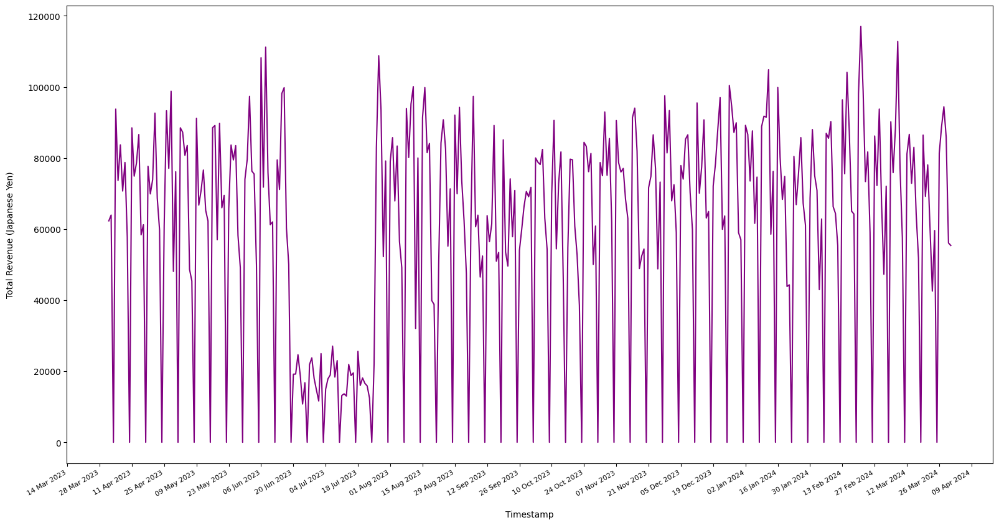

In [61]:
plot_daily_revenue()

### Part (c)

In [68]:
resources = udonya_log['org:resource'].unique()
resources = [resource for resource in resources if '-san' in resource and resource != 'Customer-san']
resource_start_events = udonya_log[(udonya_log['lifecycle:transition'] == 'start') & (udonya_log['org:resource'].isin(resources))]
print(f"Resources: {resource_start_events['org:resource'].unique()}")

Resources: ['Oku-san' 'Tenchou-san' 'Deshi-san B' 'Baito-san A' 'Baito-san B'
 'Deshi-san A']


In [71]:
weekly_durations = resource_start_events.groupby([pd.Grouper(key='time:timestamp', freq='W'), 'org:resource']).duration_in_s.sum().reset_index()
weekly_durations['duration_in_h'] = weekly_durations['duration_in_s'] / 3600
weekly_durations["time:timestamp"] = weekly_durations["time:timestamp"].dt.date
weekly_durations["week_start"] = weekly_durations["time:timestamp"] - pd.Timedelta(days=6)
weekly_durations["week_end"] = weekly_durations["time:timestamp"]
weekly_durations

,time:timestamp,org:resource,duration_in_s,duration_in_h,week_start,week_end
0,2023-04-02,Baito-san A,7500.000000,2.083333,2023-03-27,2023-04-02
1,2023-04-02,Baito-san B,9600.000000,2.666667,2023-03-27,2023-04-02
2,2023-04-02,Deshi-san A,7212.000000,2.003333,2023-03-27,2023-04-02
3,2023-04-02,Deshi-san B,6525.000000,1.812500,2023-03-27,2023-04-02
4,2023-04-02,Oku-san,23767.999978,6.602222,2023-03-27,2023-04-02
...,...,...,...,...,...,...
311,2024-03-31,Baito-san B,32760.000000,9.100000,2024-03-25,2024-03-31
312,2024-03-31,Deshi-san A,30308.000000,8.418889,2024-03-25,2024-03-31
313,2024-03-31,Deshi-san B,23978.000000,6.660556,2024-03-25,2024-03-31
314,2024-03-31,Oku-san,66422.666581,18.450741,2024-03-25,2024-03-31


In [161]:
unique_resources = weekly_durations['org:resource'].unique()

def plot_resource_utilization(num_columns=2):
    fig, axs = plt.subplots(math.ceil(len(unique_resources) / num_columns), num_columns, figsize=(19.2, 10.8), sharex=True, sharey=True)
    fig.tight_layout(pad=5.0)
    weeks = weekly_durations['time:timestamp'].unique()
    for index, resource in enumerate(unique_resources):
        ax_position = axs[index // num_columns, index % num_columns] if num_columns > 1 else axs[index]
        resource_weekly_durations = weekly_durations[weekly_durations['org:resource'] == resource]
        ax = sns.lineplot(data=resource_weekly_durations, x='time:timestamp', y='duration_in_h', color='purple', ax=ax_position)
        weekly_locator = mdates.WeekdayLocator()
        ax.xaxis.set_major_locator(weekly_locator)
        year_month_day_formatter = mdates.DateFormatter("%d %b %Y")
        ax.xaxis.set_major_formatter(year_month_day_formatter)
        ax.tick_params(axis='both', labelsize=8)
        ax.title.set_text(f"Utilization Plot for {resource}")
        ax.set_xlabel('Timestamp', labelpad=15)
        ax.set_ylabel('Duration (Hour)', labelpad=15)    
        ax.set(ylim=(0, 35))
        ax.set_xticks(weeks)
        ax.grid(linestyle='--', color='gainsboro')
        fig.autofmt_xdate()
        fig.tight_layout()
        fig.savefig('./submission-figures/q5_part_c_resource_utilization.png')

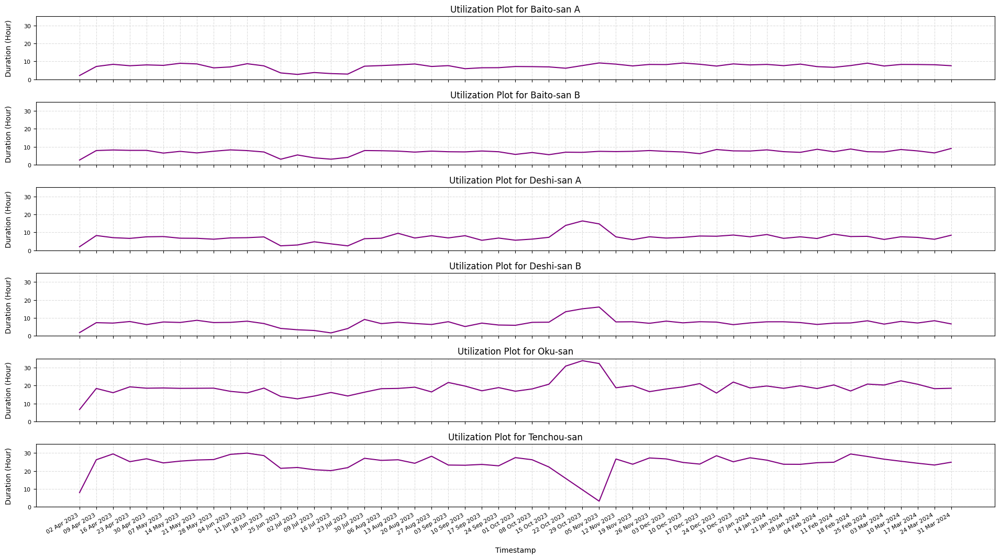

In [163]:
plot_resource_utilization(num_columns=1)

Now we want to have a deepr look into the resource utilization of **Deshi-san A**, **Deshi-san B**, **Oku-san**, **Tenchou-san**. Specifically, we want to investigate how they differ based on the activities they are responsible for in the timeframe during which there's a drop in the working hours of **Tenchou-san** but an increase in the working hours of the aforementioned resources.

In [205]:
weekly_durations_resource_activities = resource_start_events.groupby([pd.Grouper(key='time:timestamp', freq='W'), 'org:resource', 'concept:name']).duration_in_s.sum().reset_index()
weekly_durations_resource_activities['duration_in_h'] = weekly_durations_resource_activities['duration_in_s'] / 3600
weekly_durations_resource_activities['week'] = weekly_durations_resource_activities['time:timestamp'].dt.strftime("%Y-%U")
weekly_durations_resource_activities["time:timestamp"] = weekly_durations_resource_activities["time:timestamp"].dt.date

target_resources = ['Deshi-san A', 'Deshi-san B', 'Tenchou-san', 'Oku-san']
weekly_durations_resource_activities = weekly_durations_resource_activities[weekly_durations_resource_activities['org:resource'].isin(target_resources)]

display(weekly_durations_resource_activities)

resource_activities = [set(weekly_durations_resource_activities[weekly_durations_resource_activities['org:resource'] == resource]['concept:name'].values.tolist()) for resource in target_resources]
shared_activities = set.intersection(*map(set, resource_activities))

,time:timestamp,org:resource,concept:name,duration_in_s,duration_in_h,week
14,2023-04-02,Deshi-san A,Add Curry to Bowl,612.0,0.170000,2023-14
15,2023-04-02,Deshi-san A,Add Dashi to Bowl,325.0,0.090278,2023-14
16,2023-04-02,Deshi-san A,Add Rice to Bowl,128.0,0.035556,2023-14
17,2023-04-02,Deshi-san A,Add Tempura to Bowl,483.0,0.134167,2023-14
18,2023-04-02,Deshi-san A,Add Udon to Bowl,964.0,0.267778,2023-14
...,...,...,...,...,...,...
4449,2024-03-31,Tenchou-san,Roll Udon Dough,1740.0,0.483333,2024-13
4450,2024-03-31,Tenchou-san,Strain Dashi,3420.0,0.950000,2024-13
4451,2024-03-31,Tenchou-san,Strain and Wash Udon,2978.0,0.827222,2024-13
4452,2024-03-31,Tenchou-san,Take out Tempura,2170.5,0.602917,2024-13


In [274]:
def plot_resource_utilization_based_on_activities(num_columns=2):
    fig, axs = plt.subplots(math.ceil(len(shared_activities) / num_columns), num_columns, figsize=(19.2, 10.8), sharex=True, sharey=True)
    weeks = weekly_durations_resource_activities['time:timestamp'].unique()
    palette={'Deshi-san A': 'red', 'Deshi-san B': 'blue', 'Tenchou-san': 'green', 'Oku-san': 'purple'}
    handles, labels = [], []
    for index, activity in enumerate(shared_activities):
        ax_position = axs[index // num_columns, index % num_columns] if num_columns > 1 else axs[index]
        resource_activity_weekly_durations = weekly_durations_resource_activities[weekly_durations_resource_activities['concept:name'] == activity]
        ax = sns.scatterplot(data=resource_activity_weekly_durations, x='time:timestamp', y='duration_in_h', hue='org:resource', palette=palette, ax=ax_position)
        weekly_locator = mdates.WeekdayLocator()
        ax.xaxis.set_major_locator(weekly_locator)
        year_month_day_formatter = mdates.DateFormatter("%d %b %Y")
        ax.xaxis.set_major_formatter(year_month_day_formatter)
        ax.tick_params(axis='both', labelsize=5)
        ax.title.set_text(f"Utilization Plot for {activity}")
        ax.set_xlabel('Week', labelpad=15)
        ax.set_ylabel('Duration (Hour)', labelpad=15)    
        ax.set_xticks(weeks)
        ax.set_xticklabels(weeks, rotation = 90)
        curr_handles, curr_labels = ax.get_legend_handles_labels()
        handles.extend(curr_handles)
        labels.extend(curr_labels)
        ax.get_legend().remove()
        ax.grid(linestyle='--', color='gainsboro')
    lgd = plt.legend(handles[:4],labels, bbox_to_anchor=(1,0.88), 
                          bbox_transform=plt.gcf().transFigure)
    fig.tight_layout()
    fig.savefig('./submission-figures/q5_part_c_resource_activity_utilization.png', bbox_extra_artists=(lgd,), bbox_inches='tight')

C:\Users\Erfan Moeini\AppData\Local\Temp\ipykernel_8440\2087266773.py:27: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  fig.tight_layout()


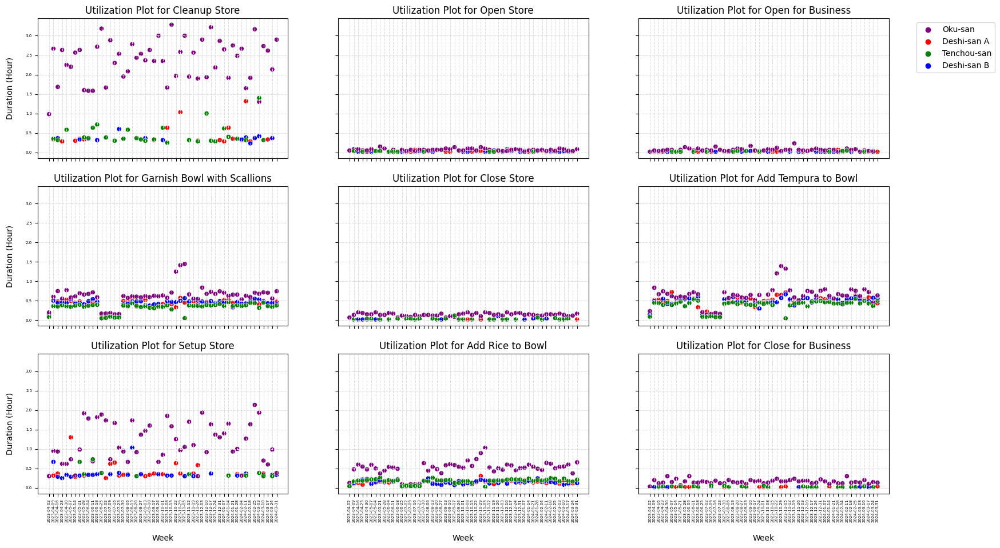

In [275]:
plot_resource_utilization_based_on_activities(num_columns=3)

In [122]:
weekly_revenue = customer_pay_df.groupby([pd.Grouper(key='time:timestamp', freq='W')]).amount.sum().reset_index()
print("Highest weekly revenue:")
display(weekly_revenue[weekly_revenue['amount'] == weekly_revenue['amount'].max()])
print("Highest weekly resource utilization:")
weekly_utilization_accumulated = weekly_durations.groupby('time:timestamp')['duration_in_h'].sum().reset_index()
weekly_utilization_accumulated[weekly_utilization_accumulated.duration_in_h == weekly_utilization_accumulated.duration_in_h.max()]

Highest weekly revenue:


,time:timestamp,amount
47,2024-02-25 00:00:00+00:00,527890.0


Highest weekly resource utilization:


,time:timestamp,duration_in_h
31,2023-11-05,82.798518


# Technical Questions

## Inductive Miner Cut

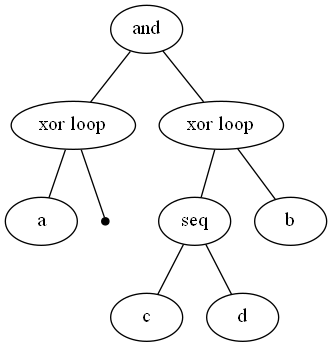

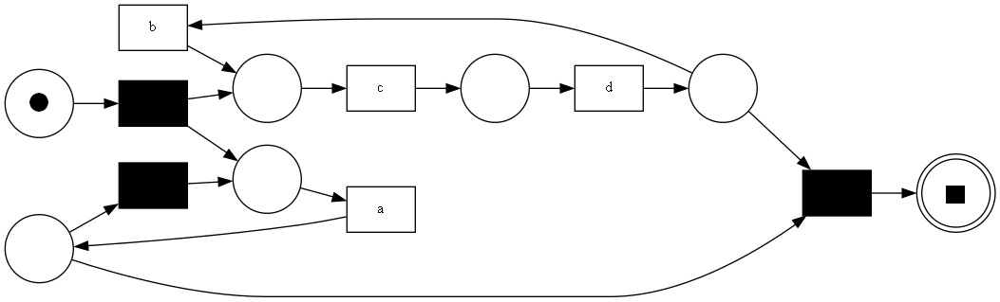

exporting log, completed traces :: 100%|█████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]


In [5]:
sample_log = pm4py.parse_event_log_string(["a,c,d,b,c,d", "c,a,a,d", "c,d,b,c,d,a"])
net, im, fm = pm4py.discover_petri_net_inductive(sample_log)
process_tree = pm4py.discover_process_tree_inductive(sample_log)
pm4py.view_process_tree(process_tree)
pm4py.view_petri_net(net, im, fm)
pm4py.save_vis_petri_net(net, im, fm, "./submission-figures/q6_IM_cut_petri_net.png")
pm4py.save_vis_process_tree(process_tree, "./submission-figures/q6_IM_cut_process_tree.png")
pm4py.write_xes(sample_log, "./submission-data/im-log-group85.xes")

## Conformance Checking

In the following, you find the implementation of the method described in the report.

Parts that require you to implement something a marked by **TODO**.

Your manipulation functions should satisfy the invariant that the structure of the input and output dataframe  have the same columns. More precisely, your output dataframe might have more columns, but it requires at least the columns contained in the input dataframe.


In [122]:
df = pd.read_csv('./input-logs/align-data.csv')

In [123]:
df = pm4py.format_dataframe(df)

C:\Users\Erfan Moeini\AppData\Local\Temp\ipykernel_5156\1694163285.py:1: DeprecatedWarning: format_dataframe is deprecated as of 2.3.0 and will be removed in 3.0.0. the format_dataframe function does not need application anymore.
  df = pm4py.format_dataframe(df)
D:\Projects\apm-assignment-1\venv\Lib\site-packages\pm4py\objects\log\util\dataframe_utils.py:176: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col], utc=True)


In [124]:
tree = pm4py.read_ptml('./input-models/cc-technical-ground-truth-model.ptml')

In [125]:
net, im, fm = pm4py.convert_to_petri_net(tree)

## Manipulation Functions

In [143]:
def generate_random_tuple(lower_bound, upper_bound, candidates):
    first_index, second_index = random.randint(lower_bound, upper_bound), random.randint(lower_bound, upper_bound)
    while first_index == second_index or (first_index, second_index) in candidates or (second_index, first_index) in candidates:
        first_index, second_index = random.randint(lower_bound, upper_bound), random.randint(lower_bound, upper_bound)
        
    return first_index, second_index


def distribute_random_values(count, total_sum):
    random_assignments = [0] * count
    
    # To make the sum of the final list as total_sum
    seed_value = 0
    for i in range(total_sum):
        random.seed(seed_value)
        # Increment any random element
        # from the array by 1
        random_assignments[random.randint(0, total_sum) % count] += 1
        seed_value += 1
 
    return random_assignments

def swap_events(df: pd.DataFrame, target_nbr_swaps: int) -> pd.DataFrame:
    """
    Perform target_nbr_swaps of event swaps in a 
    copy of the provided dataframe. 
    Swaps are executed within a case.
    """

    # Create a working copy
    df_copy = df.copy()
    
    # TODO 
    # It is up to you how you sample events as long as it is reasonable.
    # The should be some randomness regarding the affected cases as well as the affected events.
    # Only swap events that have the same case id.
    target_nbr_swaps = round(target_nbr_swaps)
    cases = df_copy['case:concept:name'].unique()
    random_swap_counts_per_case = distribute_random_values(len(cases), target_nbr_swaps)
    
    for index, case in enumerate(cases):
        case_events = df_copy[df_copy['case:concept:name'] == case]
        # Check if the two events should be consecutive, or they can be from any position within the trace
        random_swap_index_candidates = []
        case_swap_count = random_swap_counts_per_case[index]
        while len(random_swap_index_candidates) != case_swap_count:
            first_index, second_index = random.randint(0, len(case_events) - 1), random.randint(0, len(case_events) - 1)
            if first_index != second_index and not ((first_index, second_index) in random_swap_index_candidates or (second_index, first_index) in random_swap_index_candidates):
                random_swap_index_candidates.append((first_index, second_index))
                case_events.iloc[first_index], case_events.iloc[second_index] =  case_events.iloc[second_index].copy(), case_events.iloc[first_index].copy()
                case_events.loc[case_events.index[first_index], 'time:timestamp'], case_events.loc[case_events.index[second_index], 'time:timestamp'] = case_events.loc[case_events.index[second_index], 'time:timestamp'], case_events.loc[case_events.index[first_index], 'time:timestamp']
        df_copy.loc[case_events.index] = case_events
    return df_copy


In [144]:
def drop_events(df: pd.DataFrame, nbr_drop: int) -> pd.DataFrame:
    """
    Drops the given number of events 
    (selected uniformly at random)
    """

    # TODO
    df_copy = df.copy()
    nbr_drop = round(nbr_drop)
    np.random.seed(42)
    random_event_indices = np.random.choice(df_copy.index, nbr_drop)
    df_copy.drop(random_event_indices, inplace=True)
    
    return df_copy

## Grid Search

In [145]:
# Create a parameter grid
param_grid = {'frac_swaps': [0.0, 0.05, 0.1, 0.15], 'frac_drop': [0.0, 0.05, 0.1, 0.15]}
grid = ParameterGrid(param_grid)

In [146]:
l_res = []
nbr_events = len(df.index)
# Start timer - outer loop
start_time_outer_loop = time.time()
for config in grid:
    print(f'Creating log for {config}')
    # Calculate nbr of transformations
    nbr_swaps = int(config['frac_swaps'] * nbr_events)
    nbr_drop = int(config['frac_drop'] * nbr_events)
    # Swap first; dropping will invalidate the intra-case indexing
    df_tmp = swap_events(df, nbr_swaps)
    df_tmp = drop_events(df_tmp, nbr_drop)
    print(f'Running alignments for {config}')
    # Start timer
    start_time = time.time()
    
    # Calculate alignments
    alignments_diagnostics = pm4py.conformance_diagnostics_alignments(df_tmp, net, im, fm)
    assert alignments_diagnostics is not None
    # Sleep a random number of seconds (between 1 and 3)
    #time.sleep(randint(1,2))

    # End timer
    end_time = time.time()

    # Calculate elapsed time
    elapsed_time = end_time - start_time
    
    res = {**config, 'time': elapsed_time}
    
    l_res.append(res)
    print(config)
    
# End timer - outer loop
end_time_outer_loop = time.time()
print(f'Grid search took {end_time_outer_loop - start_time_outer_loop}s')

Creating log for {'frac_drop': 0.0, 'frac_swaps': 0.0}
Running alignments for {'frac_drop': 0.0, 'frac_swaps': 0.0}


aligning log, completed variants :: 100%|█████████████████████████████████████████| 1488/1488 [00:12<00:00, 116.79it/s]


{'frac_drop': 0.0, 'frac_swaps': 0.0}
Creating log for {'frac_drop': 0.0, 'frac_swaps': 0.05}
Running alignments for {'frac_drop': 0.0, 'frac_swaps': 0.05}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 1963/1963 [00:50<00:00, 38.80it/s]


{'frac_drop': 0.0, 'frac_swaps': 0.05}
Creating log for {'frac_drop': 0.0, 'frac_swaps': 0.1}
Running alignments for {'frac_drop': 0.0, 'frac_swaps': 0.1}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2269/2269 [01:07<00:00, 33.59it/s]


{'frac_drop': 0.0, 'frac_swaps': 0.1}
Creating log for {'frac_drop': 0.0, 'frac_swaps': 0.15}
Running alignments for {'frac_drop': 0.0, 'frac_swaps': 0.15}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2447/2447 [01:18<00:00, 31.01it/s]


{'frac_drop': 0.0, 'frac_swaps': 0.15}
Creating log for {'frac_drop': 0.05, 'frac_swaps': 0.0}
Running alignments for {'frac_drop': 0.05, 'frac_swaps': 0.0}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 1790/1790 [00:22<00:00, 80.00it/s]


{'frac_drop': 0.05, 'frac_swaps': 0.0}
Creating log for {'frac_drop': 0.05, 'frac_swaps': 0.05}
Running alignments for {'frac_drop': 0.05, 'frac_swaps': 0.05}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2193/2193 [00:42<00:00, 51.52it/s]


{'frac_drop': 0.05, 'frac_swaps': 0.05}
Creating log for {'frac_drop': 0.05, 'frac_swaps': 0.1}
Running alignments for {'frac_drop': 0.05, 'frac_swaps': 0.1}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2448/2448 [01:00<00:00, 40.69it/s]


{'frac_drop': 0.05, 'frac_swaps': 0.1}
Creating log for {'frac_drop': 0.05, 'frac_swaps': 0.15}
Running alignments for {'frac_drop': 0.05, 'frac_swaps': 0.15}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2618/2618 [01:19<00:00, 33.08it/s]


{'frac_drop': 0.05, 'frac_swaps': 0.15}
Creating log for {'frac_drop': 0.1, 'frac_swaps': 0.0}
Running alignments for {'frac_drop': 0.1, 'frac_swaps': 0.0}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 1931/1931 [00:28<00:00, 68.05it/s]


{'frac_drop': 0.1, 'frac_swaps': 0.0}
Creating log for {'frac_drop': 0.1, 'frac_swaps': 0.05}
Running alignments for {'frac_drop': 0.1, 'frac_swaps': 0.05}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2294/2294 [00:46<00:00, 48.90it/s]


{'frac_drop': 0.1, 'frac_swaps': 0.05}
Creating log for {'frac_drop': 0.1, 'frac_swaps': 0.1}
Running alignments for {'frac_drop': 0.1, 'frac_swaps': 0.1}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2527/2527 [01:01<00:00, 41.08it/s]


{'frac_drop': 0.1, 'frac_swaps': 0.1}
Creating log for {'frac_drop': 0.1, 'frac_swaps': 0.15}
Running alignments for {'frac_drop': 0.1, 'frac_swaps': 0.15}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2677/2677 [01:14<00:00, 36.01it/s]


{'frac_drop': 0.1, 'frac_swaps': 0.15}
Creating log for {'frac_drop': 0.15, 'frac_swaps': 0.0}
Running alignments for {'frac_drop': 0.15, 'frac_swaps': 0.0}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2022/2022 [00:36<00:00, 56.04it/s]


{'frac_drop': 0.15, 'frac_swaps': 0.0}
Creating log for {'frac_drop': 0.15, 'frac_swaps': 0.05}
Running alignments for {'frac_drop': 0.15, 'frac_swaps': 0.05}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2358/2358 [00:45<00:00, 51.80it/s]


{'frac_drop': 0.15, 'frac_swaps': 0.05}
Creating log for {'frac_drop': 0.15, 'frac_swaps': 0.1}
Running alignments for {'frac_drop': 0.15, 'frac_swaps': 0.1}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2581/2581 [01:02<00:00, 41.34it/s]


{'frac_drop': 0.15, 'frac_swaps': 0.1}
Creating log for {'frac_drop': 0.15, 'frac_swaps': 0.15}
Running alignments for {'frac_drop': 0.15, 'frac_swaps': 0.15}


aligning log, completed variants :: 100%|██████████████████████████████████████████| 2712/2712 [01:13<00:00, 36.95it/s]

{'frac_drop': 0.15, 'frac_swaps': 0.15}
Grid search took 1436.4993252754211s


## Visualize Result as Heatmap

In [147]:
df_res = pd.DataFrame(l_res)

In [148]:
df_pivot = df_res.pivot(index='frac_drop', columns='frac_swaps', values='time')

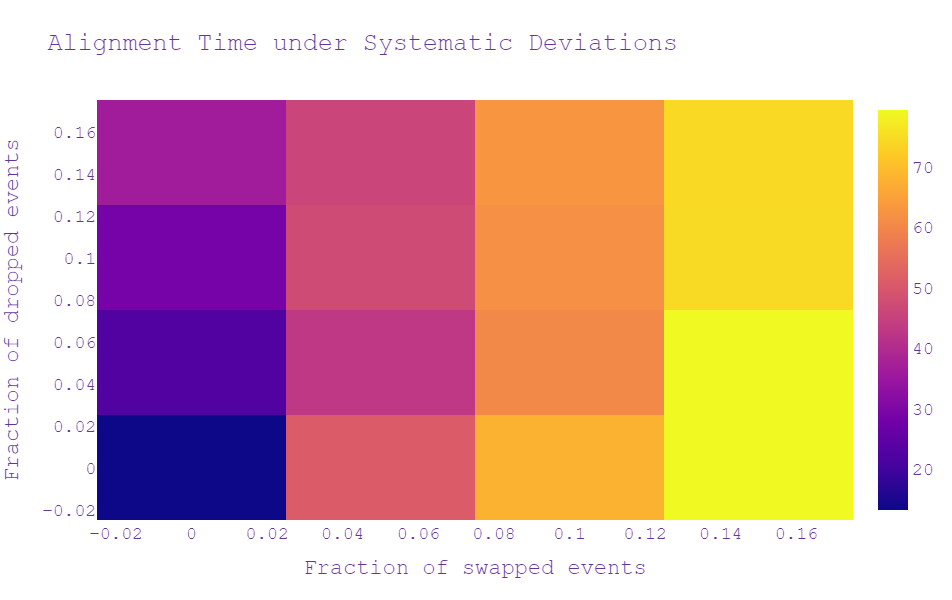

In [149]:
fig = go.Figure(data=go.Heatmap(
    x=df_pivot.columns,
    y=df_pivot.index,
    z=df_pivot.values))
fig.update_layout(
    title="Alignment Time under Systematic Deviations",
    xaxis_title="Fraction of swapped events",
    yaxis_title="Fraction of dropped events",
    legend_title="Time in s",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    ),
    width=800,
    height=600
)
fig.show()

In [150]:
fig.write_image("submission-figures/alignment-times.svg")